# Basic GAN Model
***

Creating a basic GAN model that can generate images of numbers from 0 to 9, using the MNIST dataset

## Import Libraries

In [1]:
import os
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid, save_image
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [2]:
HOME = os.getcwd()
print(HOME)

/home/mohit/Development/GANs/NNFL-Project/Basic_GAN


In [3]:
!mkdir {HOME}/Results
!mkdir {HOME}/graphs

mkdir: cannot create directory ‘/home/mohit/Development/GANs/NNFL-Project/Basic_GAN/Results’: File exists
mkdir: cannot create directory ‘/home/mohit/Development/GANs/NNFL-Project/Basic_GAN/graphs’: File exists


## Visualising Functions

Visualise the functions
- <code>ch=1</code>: One channel since black and white images
- <code>size=(28,28)</code>: Input size of data images
- <code>num=16</code>: display 16 images in the grid
- <code>tenor.detach</code>: Detach the variable from computation of gradients because we just want to visualise what is scontained in the variable
- The size of tensor should be be (128 x 784): 128 batch size; (28 x 28) = 784
- <code>view.(-1,ch,*size)</code>: reshaping the tensor into (128 x 784)
- <code>make_grid</code>: Make a grid.
- <code>.permute(1,2,0)</code>: permute allows to change the order of channels. We use this because the matplotlib has order (width, height, channel), whereas pytorch uses (channel, width, height).
So 1 x 28 x 28 = 28 x 28 x 1


In [4]:
def show(tensor, ch=1, size=(28,28),num=100):
    tensor= tensor.detach().cpu().view(-1, ch, *size)
    grid = make_grid(tensor[:num], nrow=10).permute(1,2,0)
    plt.imshow(grid)
    plt.show()
    plt.savefig("Generated-image")

## Setting up main parameters and hyperparamters

The hyperparameters are:
- <code>epochs</code>: setting number of epochs (iterations of whole dataset)
- <code>cur_step</code>: current step will start at 0
- <code>info_step</code>: no of steps after which the info will be updated
- <code>mean_gen_loss</code>: average of generator loss
- <code>mean_disc_loss</code>: average of discriminator loss
- <code>z_dim</code>: dimensionality of noise vector (latent space) that is the input of the generator
- <code>lr</code>: learning rate
- <code>loss_func = nn.BCEWithLogitsLoss()</code>: Using the Binary Cross Entropy with Logits loss function. we use logits, since it converts the numerical inputs into range between 0 and 1 by applying the sigmoid function
- <code>bs</code>: Using the batch size of 128
- <code>device</code>: using the GPU to train
- <code>DataLoader</code>: Using the dataloader which iterates over our dataset and stores them

In [5]:
epochs = 200
cur_step = 0
info_step = 400
info_epoch = 25
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64
lr = 0.00001
loss_func = nn.BCEWithLogitsLoss()

bs = 128
device = 'cuda'

dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()),
                        batch_size=bs,
                        shuffle=True)

# number of steps in each epoch = total images (60000) / batch size (128) = 468.75 = 469

loss_g =[]
loss_d =[]

## Defining the Generator

The paramters of the generator block are:
- <code>nn.Linear</code>: Performs linear computation between input and output
- <code>nn.BatchNorm1d</code>: 1D batch normalisation layer to normalise the outputs from previous layer
- <code>nn.ReLU</code>: Applying the ReLU non-linear function

The hyperparamters used to train the Generator class are:
- <code>z_dim</code>: dimension of input noise vactor
- <code>i_dim</code>: dimension of output layer (28 x 28)
- <code>h_dim</code>: dimension of first hidden layer
- The generator will contain several sequential genblocks
- <code>nn.Linear</code>: Final output layer
- <code>nn.Sigmoid</code>: Using sigmoid activation function so that the output values are normalised between 0 and 1

<code>forward</code>: forward function is defined, this will be executed when we run the instance of the class

<code>gen_noise</code>: This function generates random noise

In [6]:
def genBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True))

class Generator(nn.Module):
  def __init__(self, z_dim = 64, i_dim = 784, h_dim = 128):
    super().__init__()
    self.gen = nn.Sequential(
        genBlock(z_dim, h_dim),      # 64 --> 128
        genBlock(h_dim, h_dim*2),    # 128 --> 256
        genBlock(h_dim*2, h_dim*4),  # 256 --> 512
        genBlock(h_dim*4, h_dim*8),  # 512 --> 1024
        nn.Linear(h_dim*8, i_dim),   # 1024 --> 784
        nn.Sigmoid()                 # Output values between 0 and 1
    )

  def forward(self, noise):
    return self.gen(noise)

def gen_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)

## Defining the Discriminator

The parameters of the discrimator block are:
- <code>nn.LeakyReLU</code>: We use Leaky ReLU instead of normal ReLU to avoid the dying ReLU danger (happens beacuse all -ve value are set as 0)

The hyperparameters of the Discriminator are:
- The discrimator will contain several discblock layers
- <code>nn.Linear</code>: The final output dimension must be 1, because the discriminator result will either be yes (1) for a real image or no (0) for a fake image

Here the <code>forward</code> function will take an image as an input instead of a noise vector like in generator

In [7]:
def discBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.LeakyReLU(0.2, inplace=True))

class Discriminator(nn.Module):
  def __init__(self, i_dim = 784, h_dim = 256):
    super().__init__()
    self.disc = nn.Sequential(
        discBlock(i_dim, h_dim*4),     # 784 --> 1024
        discBlock(h_dim*4, h_dim*2),   # 1024 --> 512
        discBlock(h_dim*2, h_dim),     # 512 --> 256
        nn.Linear(h_dim, 1)            # 256 --> 1
    )

  def forward(self, image):
    return self.disc(image)

## Coding the optimizer

Using the <code>Adam</code> optimiser to optimise i.e. calculate gradients. doing the backpropogation with the chain rule and then updating all the parameters and weights for our network

In [8]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [9]:
# taking a look at the generator architecture
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [16]:
# taking a look at the discrimator architecture
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

In [11]:
x, y = next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

noise = gen_noise(bs, z_dim)
print(noise.shape)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([6, 5, 0, 0, 5, 5, 7, 3, 8, 6])
torch.Size([128, 64])


This is the initial input to the generator. Since the generator has not started training yet, it will produce a very noisy output

## Calculating the losses

### Generator Loss

It will take in arguments:
- <code>loss_func</code>: We have to choose what function to use to evaluate losses
- <code>gen</code>, <code>disc</code>: the generator and discriminator models
- <code>number</code>: number of elements we want to process
- <code>z_dim</code>: dimensions of input latent vector

Obtain a noise vector for batch size and dimension of each vector. This set of noise vectors is stored as <code>fake</code> and passed through the discriminator which predicts the output value.

The <code>targets</code> will be a vector of 1's (dimension equal to that of  <code>disc_pred</code>) because the generator wants to fool the discrimator into thinking that the output images are real


In [12]:
def calc_gen_loss(loss_func, gen, disc, number, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  disc_pred = disc(fake)
  targets = torch.ones_like(disc_pred)
  gen_loss = loss_func(disc_pred, targets)

  return gen_loss

### Discriminator Loss

Here the arguments will also have <code>real</code> argument, because the discriminator needs to compare the output to real images

<code>disc(fake.detach())</code>: Here it is very important to detach, because we do not want to alter the gradients or weights of the generator during back propogation of the discriminator

<code>disc_fake_targets</code> should be a vector of 0's, because the discriminator wants to identify fake images as fake (i.e. 0).
Similarly <code>disc_real_targets</code> will be a vector of 1's

In [13]:
def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  disc_fake = disc(fake.detach())
  disc_fake_targets = torch.zeros_like(disc_fake)
  disc_fake_loss = loss_func(disc_fake, disc_fake_targets)

  disc_real = disc(real)
  disc_real_targets = torch.ones_like(disc_real)
  disc_real_loss = loss_func(disc_real, disc_real_targets)

  disc_loss = (disc_fake_loss + disc_real_loss) / 2

  return disc_loss

## Training the GAN

Number of steps in each epoch = Total images divided by batch size = 60000/128 = 468.75 = 469 steps per epoch

Each step is going to process 128 images (batch size), except the last one which will have a bit less due to 0.25 less

Runnning the training loop:
- We first train the Discriminator
 - <code>disc_opt.zer_grad()</code>: setting the discriminator optimiser gradients to zero at the start
 - <code>cur_bs</code>: defining current batch size
 - <code>real.view</code>: reshaping the vector. -1 compresses all the dimensions after 1 into one ( 1 x 28 x 28 --> 784)
 - <code>disc_loss</code>: calculating the discriminator loss
 - <code>disc_loss.backward</code>: backward propagates the losses to calculate gradients and update the weights
 - <code>disc_opt.step()</code>: tweaks and updates the parameters of the discriminator

- Now training the Generator
 - <code>gen_opt.zer_grad()</code>: setting the generator optimiser gradients to zero at the start
 - <code>gen_loss</code>: calculating the generator loss
 - <code>gen_loss.backward</code>: backward propagates the losses to calculate gradients and update the weights
 - <code>gen_opt.step()</code>: tweaks and updates the parameters of the generator

- Next we visualise and calculate the stats
 - <code>mean_disc_loss</code>, <code>mean_gen_loss</code>: calculating the average losses
 - running a loop to display the information

  0%|          | 0/469 [00:00<?, ?it/s]

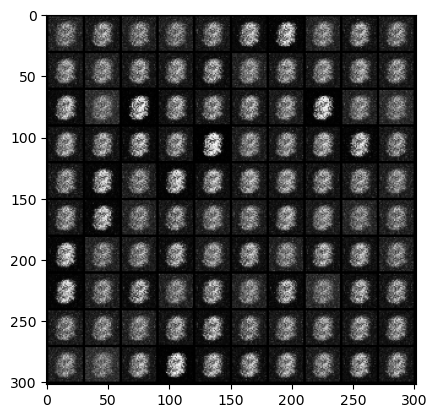

Epoch 0, step 400: Generator loss: 0.008549832105636597, Discriminator loss: 0.00032751739025115966


  0%|          | 0/469 [00:00<?, ?it/s]

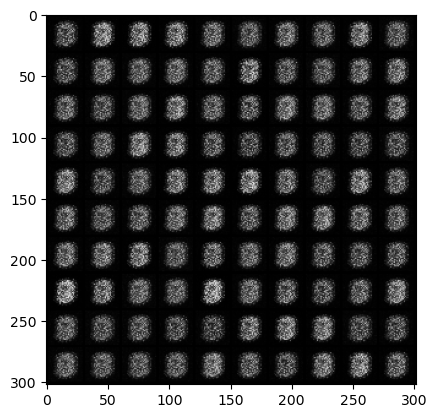

Epoch 1, step 800: Generator loss: 0.008026779890060424, Discriminator loss: 0.00014189820736646653


  0%|          | 0/469 [00:00<?, ?it/s]

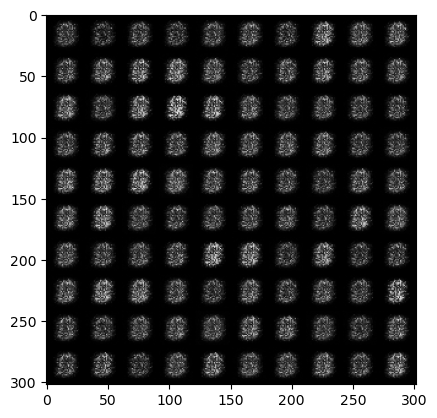

Epoch 2, step 1200: Generator loss: 0.007834620475769043, Discriminator loss: 0.0001035527978092432


  0%|          | 0/469 [00:00<?, ?it/s]

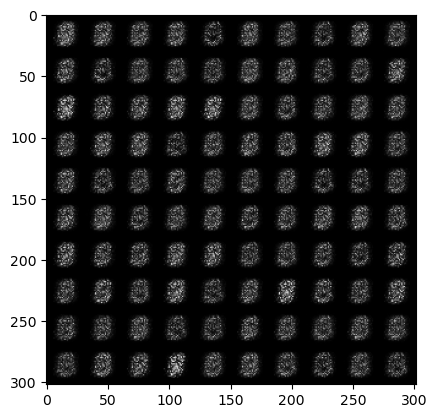

Epoch 3, step 1600: Generator loss: 0.008596662282943725, Discriminator loss: 7.109494879841804e-05


  0%|          | 0/469 [00:00<?, ?it/s]

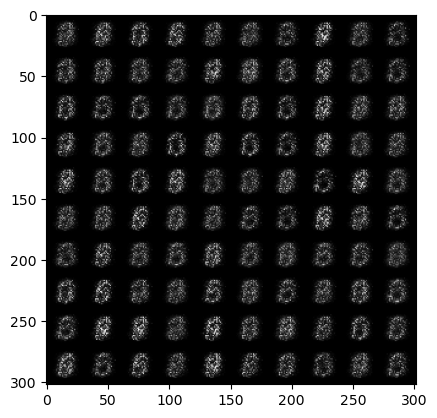

Epoch 4, step 2000: Generator loss: 0.009617650508880615, Discriminator loss: 6.734186317771673e-05


  0%|          | 0/469 [00:00<?, ?it/s]

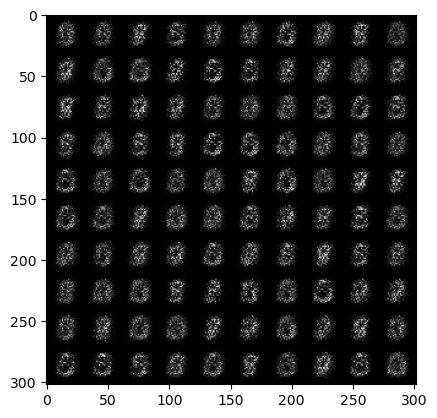

Epoch 5, step 2400: Generator loss: 0.011832900047302246, Discriminator loss: 5.524466745555401e-05


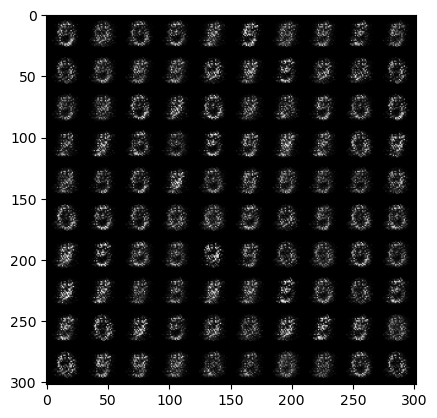

Epoch 5, step 2800: Generator loss: 0.011385154724121094, Discriminator loss: 7.772009819746018e-05


  0%|          | 0/469 [00:00<?, ?it/s]

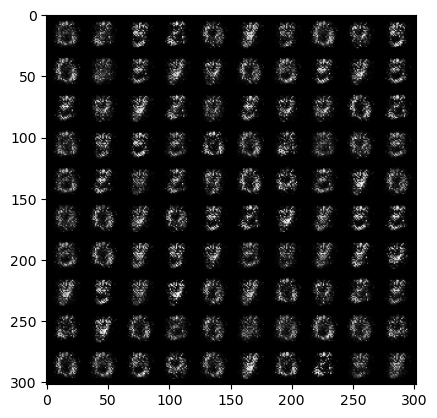

Epoch 6, step 3200: Generator loss: 0.012915573120117187, Discriminator loss: 4.785865545272827e-05


  0%|          | 0/469 [00:00<?, ?it/s]

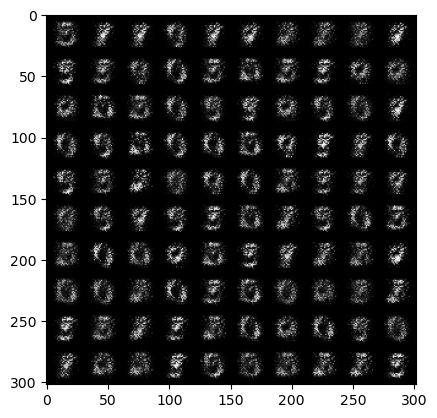

Epoch 7, step 3600: Generator loss: 0.014519356489181519, Discriminator loss: 3.6459555849432947e-05


  0%|          | 0/469 [00:00<?, ?it/s]

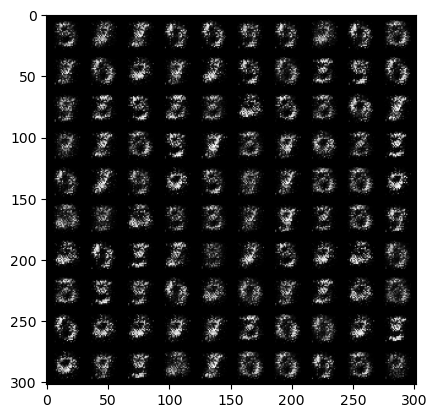

Epoch 8, step 4000: Generator loss: 0.015581793785095215, Discriminator loss: 5.346875637769699e-05


  0%|          | 0/469 [00:00<?, ?it/s]

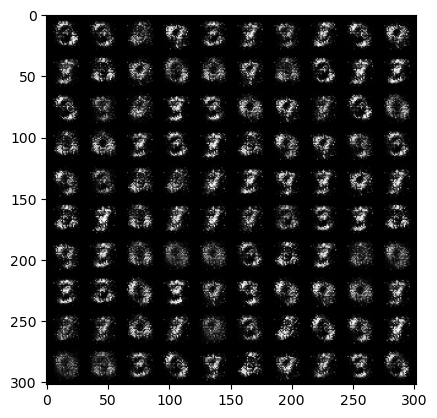

Epoch 9, step 4400: Generator loss: 0.015182133913040161, Discriminator loss: 6.792765110731124e-05


  0%|          | 0/469 [00:00<?, ?it/s]

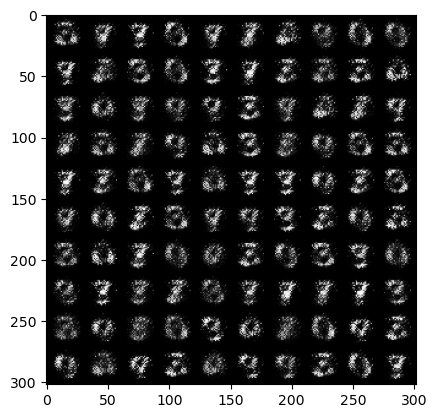

Epoch 10, step 4800: Generator loss: 0.014381765127182007, Discriminator loss: 2.6205871254205704e-05


  0%|          | 0/469 [00:00<?, ?it/s]

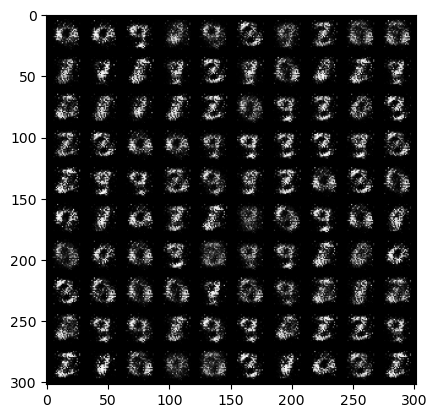

Epoch 11, step 5200: Generator loss: 0.015971797704696655, Discriminator loss: 1.747956150211394e-05


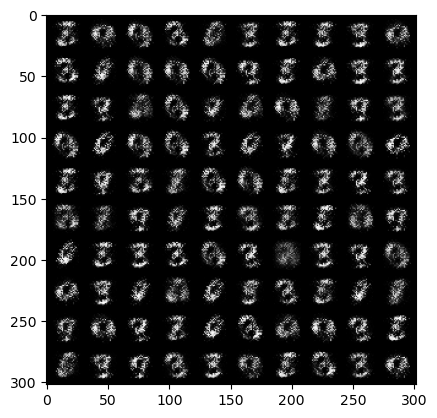

Epoch 11, step 5600: Generator loss: 0.019704105854034423, Discriminator loss: 1.3745268806815148e-05


  0%|          | 0/469 [00:00<?, ?it/s]

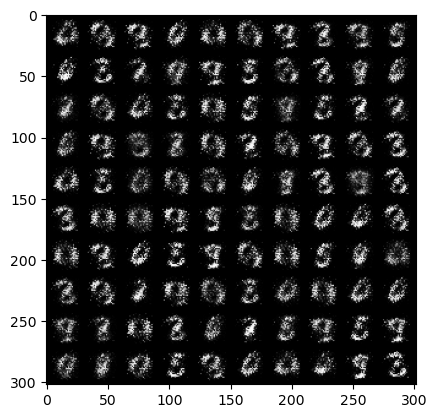

Epoch 12, step 6000: Generator loss: 0.01971497416496277, Discriminator loss: 1.125252339988947e-05


  0%|          | 0/469 [00:00<?, ?it/s]

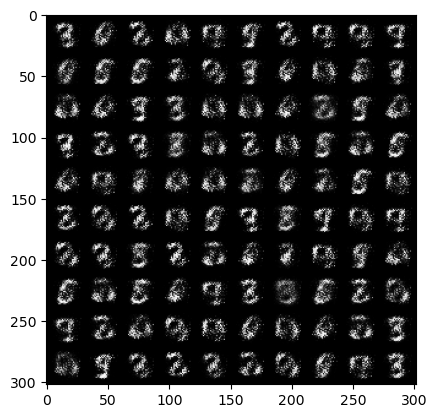

Epoch 13, step 6400: Generator loss: 0.017148540019989014, Discriminator loss: 1.5437370166182518e-05


  0%|          | 0/469 [00:00<?, ?it/s]

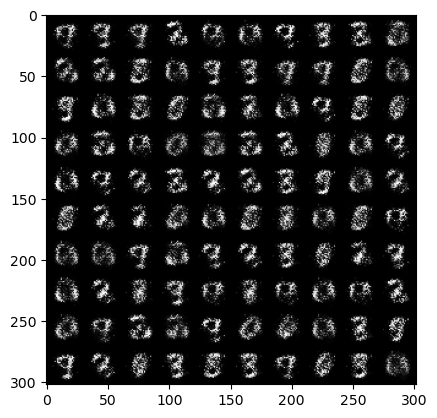

Epoch 14, step 6800: Generator loss: 0.018063982725143434, Discriminator loss: 4.001878201961517e-05


  0%|          | 0/469 [00:00<?, ?it/s]

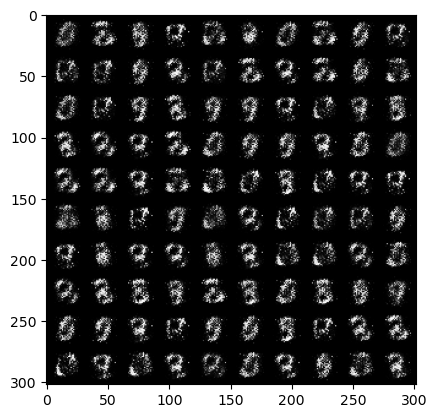

Epoch 15, step 7200: Generator loss: 0.017203866243362426, Discriminator loss: 1.9631958566606044e-05


  0%|          | 0/469 [00:00<?, ?it/s]

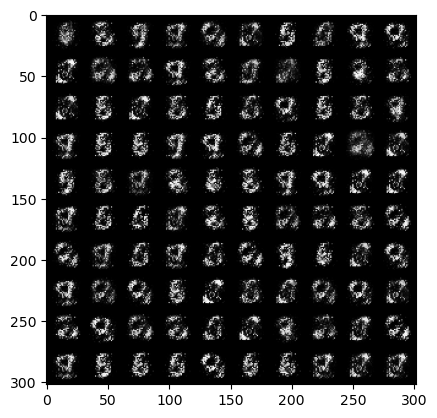

Epoch 16, step 7600: Generator loss: 0.02080792427062988, Discriminator loss: 8.97965976037085e-06


  0%|          | 0/469 [00:00<?, ?it/s]

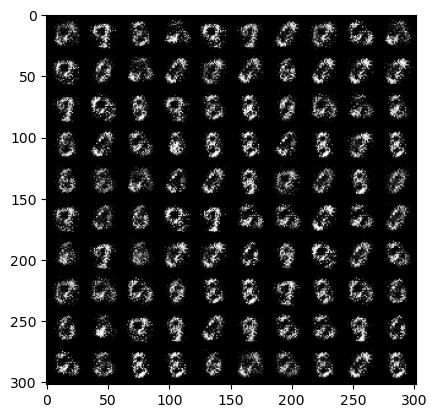

Epoch 17, step 8000: Generator loss: 0.018179754018783568, Discriminator loss: 5.691212136298418e-06


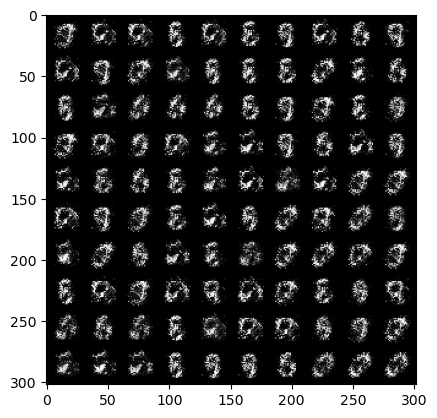

Epoch 17, step 8400: Generator loss: 0.02058408737182617, Discriminator loss: 4.213945940136909e-06


  0%|          | 0/469 [00:00<?, ?it/s]

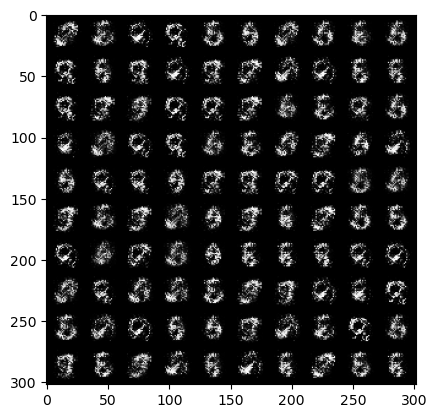

Epoch 18, step 8800: Generator loss: 0.016750295162200928, Discriminator loss: 1.3667776947841048e-05


  0%|          | 0/469 [00:00<?, ?it/s]

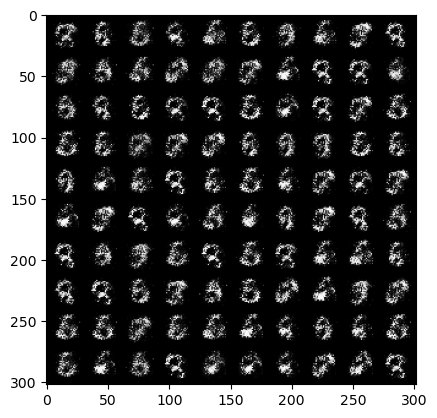

Epoch 19, step 9200: Generator loss: 0.017846803665161132, Discriminator loss: 4.370124079287052e-05


  0%|          | 0/469 [00:00<?, ?it/s]

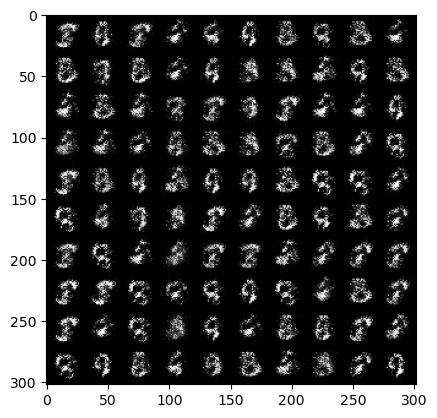

Epoch 20, step 9600: Generator loss: 0.017571274042129516, Discriminator loss: 8.76724428962916e-06


  0%|          | 0/469 [00:00<?, ?it/s]

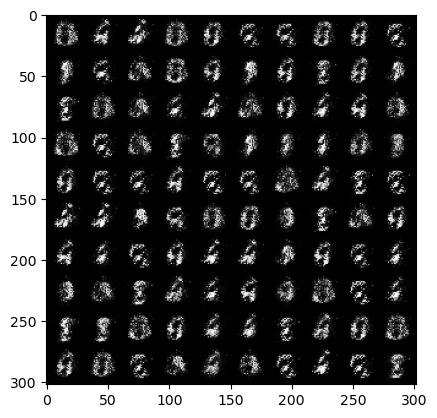

Epoch 21, step 10000: Generator loss: 0.021402339935302734, Discriminator loss: 5.199200939387083e-05


  0%|          | 0/469 [00:00<?, ?it/s]

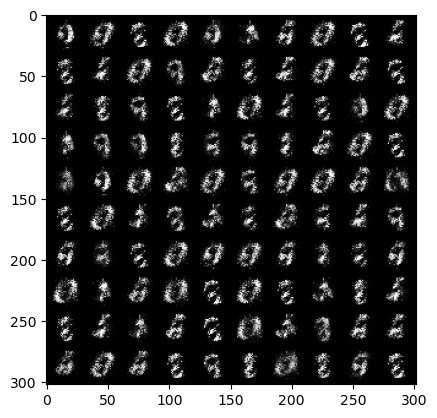

Epoch 22, step 10400: Generator loss: 0.019521809816360473, Discriminator loss: 1.6480652848258616e-05


  0%|          | 0/469 [00:00<?, ?it/s]

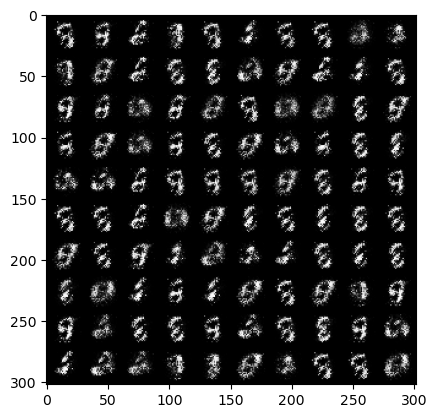

Epoch 23, step 10800: Generator loss: 0.021309199333190917, Discriminator loss: 7.811612915247678e-05


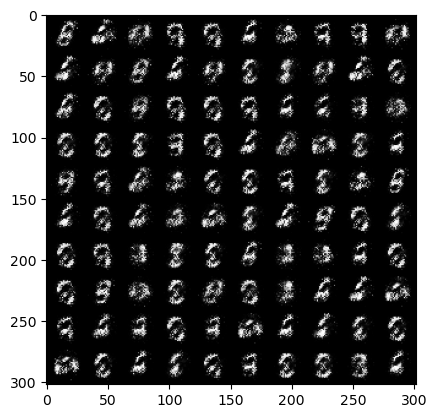

Epoch 23, step 11200: Generator loss: 0.018669610023498536, Discriminator loss: 1.2474087998270989e-05


  0%|          | 0/469 [00:00<?, ?it/s]

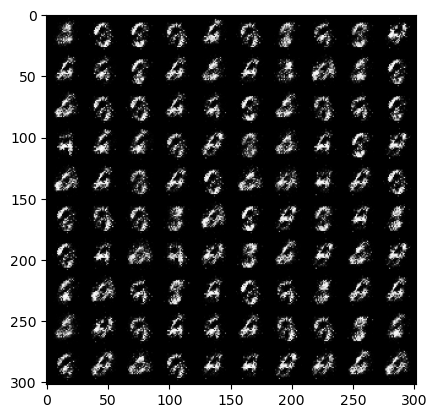

Epoch 24, step 11600: Generator loss: 0.01493674635887146, Discriminator loss: 3.15378000959754e-05


  0%|          | 0/469 [00:00<?, ?it/s]

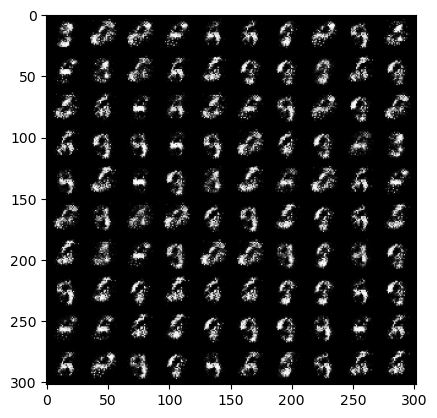

Epoch 25, step 12000: Generator loss: 0.015372307300567626, Discriminator loss: 4.288934171199799e-05


  0%|          | 0/469 [00:00<?, ?it/s]

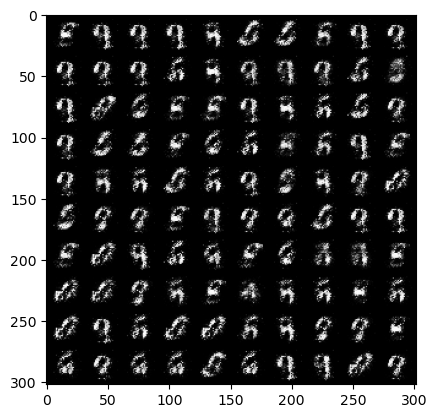

Epoch 26, step 12400: Generator loss: 0.01819849491119385, Discriminator loss: 2.065605716779828e-05


  0%|          | 0/469 [00:00<?, ?it/s]

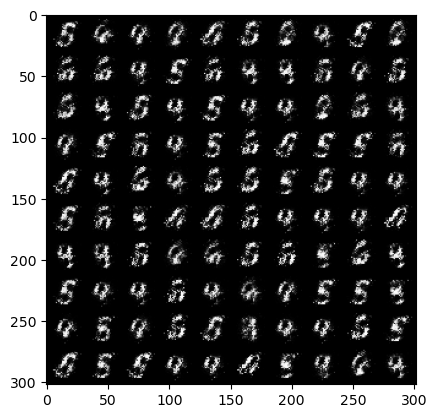

Epoch 27, step 12800: Generator loss: 0.01899176597595215, Discriminator loss: 2.211585408076644e-05


  0%|          | 0/469 [00:00<?, ?it/s]

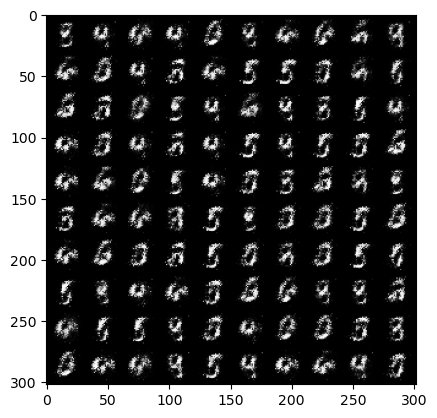

Epoch 28, step 13200: Generator loss: 0.018676536083221437, Discriminator loss: 7.664867676794529e-05


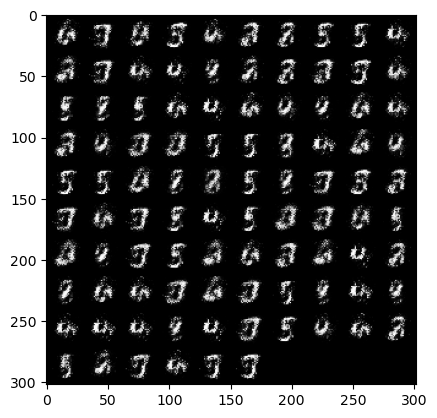

Epoch 28, step 13600: Generator loss: 0.0152949857711792, Discriminator loss: 2.3005639668554068e-05


  0%|          | 0/469 [00:00<?, ?it/s]

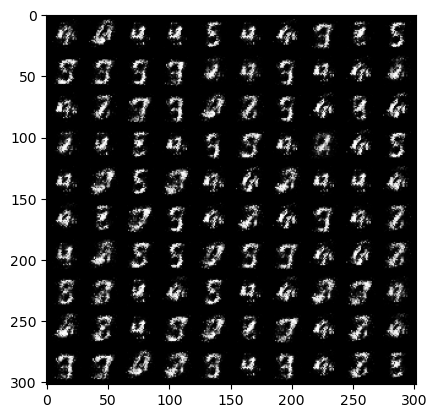

Epoch 29, step 14000: Generator loss: 0.018039094209671022, Discriminator loss: 0.00016454067081212999


  0%|          | 0/469 [00:00<?, ?it/s]

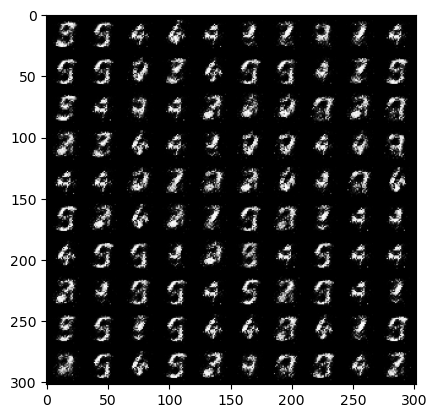

Epoch 30, step 14400: Generator loss: 0.019016618728637694, Discriminator loss: 4.5242318883538246e-05


  0%|          | 0/469 [00:00<?, ?it/s]

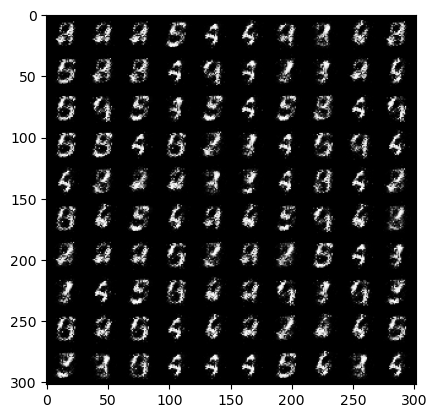

Epoch 31, step 14800: Generator loss: 0.01842437148094177, Discriminator loss: 2.160173375159502e-05


  0%|          | 0/469 [00:00<?, ?it/s]

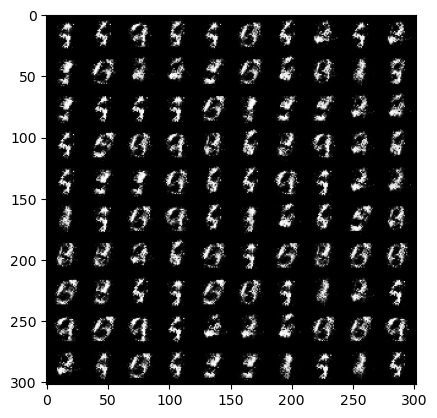

Epoch 32, step 15200: Generator loss: 0.01780961275100708, Discriminator loss: 7.41959223523736e-05


  0%|          | 0/469 [00:00<?, ?it/s]

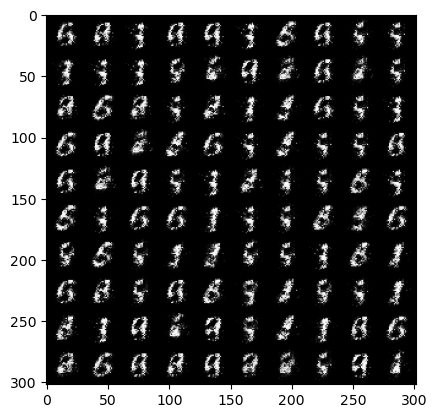

Epoch 33, step 15600: Generator loss: 0.01820973515510559, Discriminator loss: 3.896638518199325e-05


  0%|          | 0/469 [00:00<?, ?it/s]

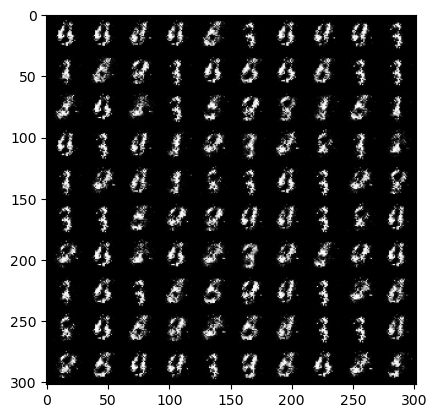

Epoch 34, step 16000: Generator loss: 0.019637093544006348, Discriminator loss: 1.6182023100554942e-05


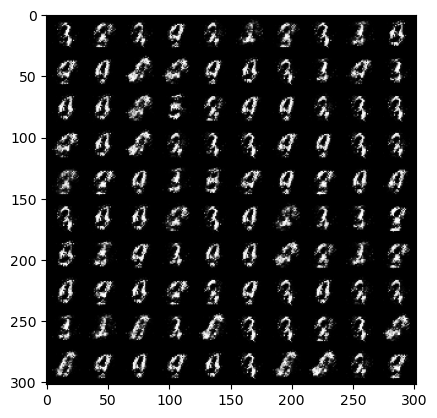

Epoch 34, step 16400: Generator loss: 0.01685800313949585, Discriminator loss: 0.00013293336145579814


  0%|          | 0/469 [00:00<?, ?it/s]

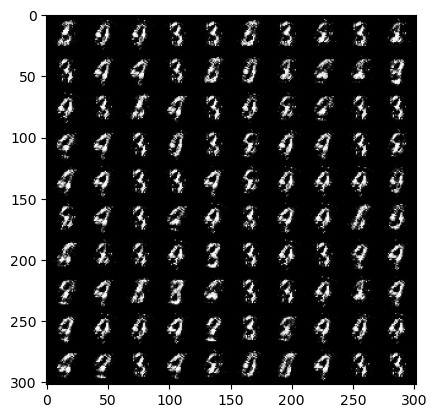

Epoch 35, step 16800: Generator loss: 0.014147653579711914, Discriminator loss: 7.500450126826763e-05


  0%|          | 0/469 [00:00<?, ?it/s]

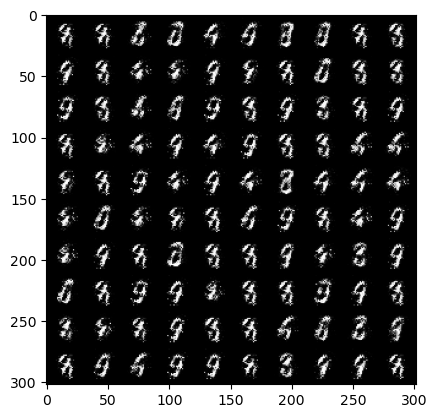

Epoch 36, step 17200: Generator loss: 0.015066094398498535, Discriminator loss: 2.5610416196286677e-05


  0%|          | 0/469 [00:00<?, ?it/s]

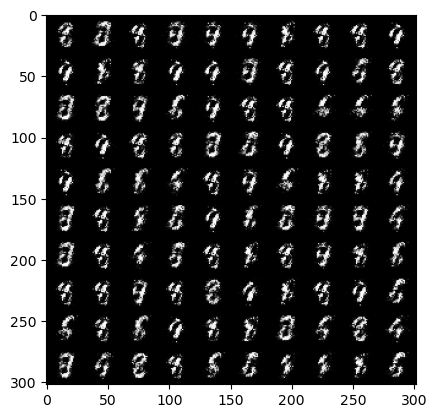

Epoch 37, step 17600: Generator loss: 0.015637552738189696, Discriminator loss: 3.774958662688732e-05


  0%|          | 0/469 [00:00<?, ?it/s]

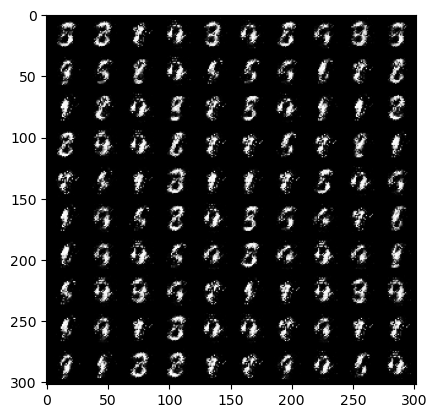

Epoch 38, step 18000: Generator loss: 0.017035818099975585, Discriminator loss: 8.403968065977096e-05


  0%|          | 0/469 [00:00<?, ?it/s]

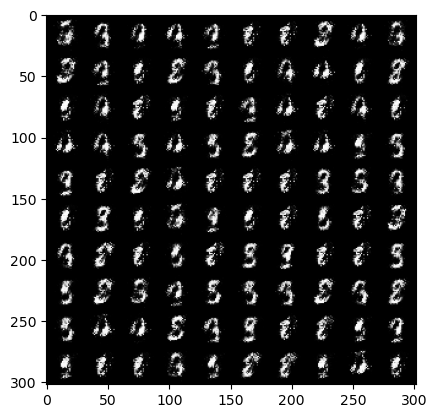

Epoch 39, step 18400: Generator loss: 0.01652664303779602, Discriminator loss: 2.6957837399095297e-05


  0%|          | 0/469 [00:00<?, ?it/s]

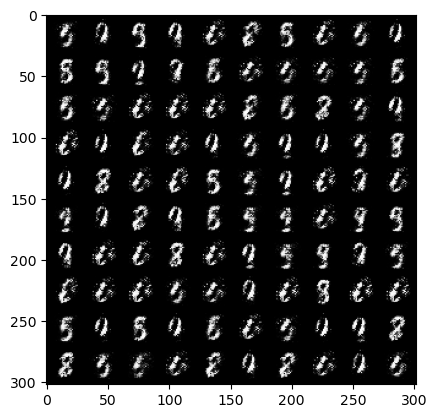

Epoch 40, step 18800: Generator loss: 0.016954379081726076, Discriminator loss: 1.8269462743774055e-05


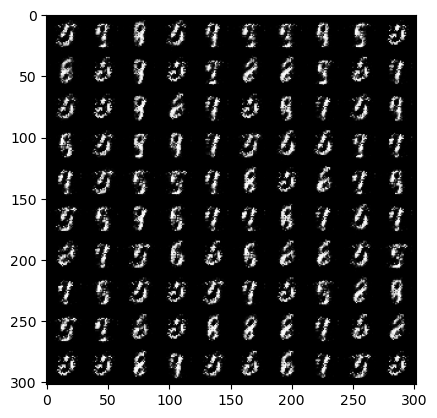

Epoch 40, step 19200: Generator loss: 0.0212005352973938, Discriminator loss: 1.5394717920571565e-05


  0%|          | 0/469 [00:00<?, ?it/s]

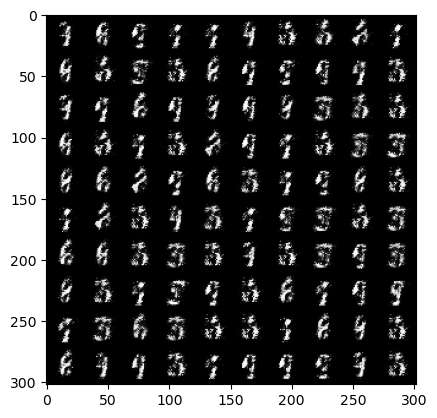

Epoch 41, step 19600: Generator loss: 0.017547316551208496, Discriminator loss: 3.914599772542715e-05


  0%|          | 0/469 [00:00<?, ?it/s]

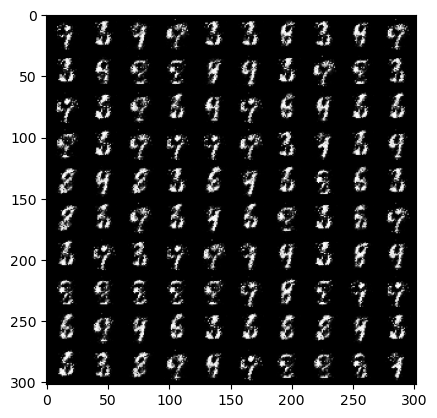

Epoch 42, step 20000: Generator loss: 0.018533867597579957, Discriminator loss: 3.678642213344574e-05


  0%|          | 0/469 [00:00<?, ?it/s]

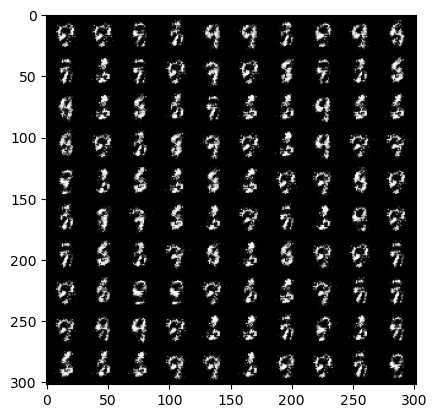

Epoch 43, step 20400: Generator loss: 0.018669323921203615, Discriminator loss: 6.029350683093071e-05


  0%|          | 0/469 [00:00<?, ?it/s]

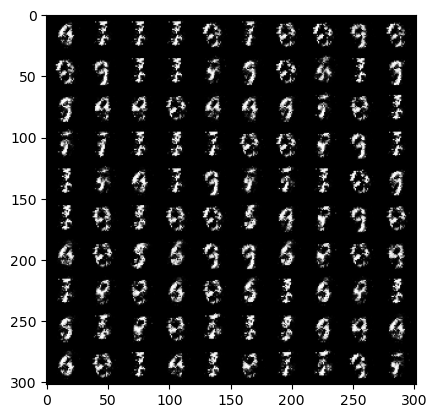

Epoch 44, step 20800: Generator loss: 0.016036648750305176, Discriminator loss: 0.0001226204913109541


  0%|          | 0/469 [00:00<?, ?it/s]

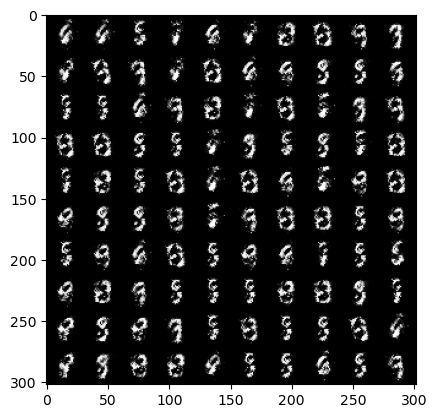

Epoch 45, step 21200: Generator loss: 0.016549158096313476, Discriminator loss: 4.934033378958702e-05


  0%|          | 0/469 [00:00<?, ?it/s]

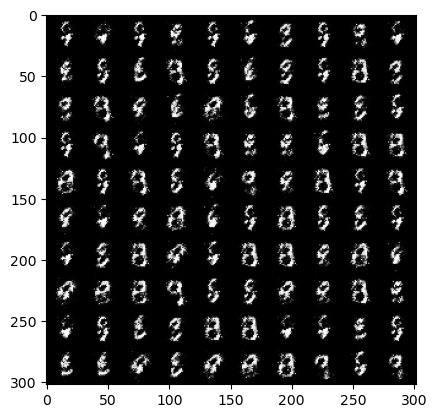

Epoch 46, step 21600: Generator loss: 0.01781068801879883, Discriminator loss: 5.112175829708576e-05


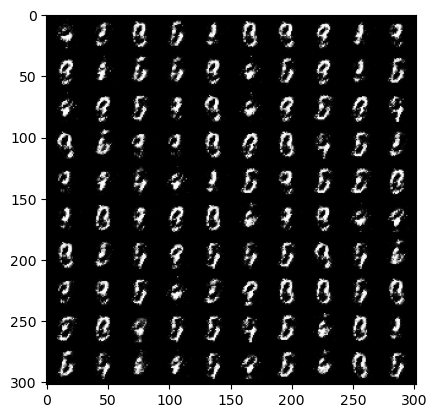

Epoch 46, step 22000: Generator loss: 0.016308298110961916, Discriminator loss: 5.6205536238849164e-05


  0%|          | 0/469 [00:00<?, ?it/s]

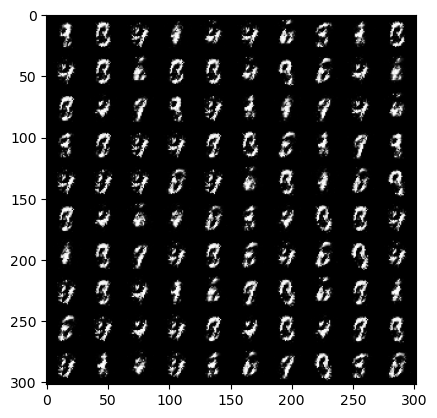

Epoch 47, step 22400: Generator loss: 0.016283400058746338, Discriminator loss: 5.937809590250254e-05


  0%|          | 0/469 [00:00<?, ?it/s]

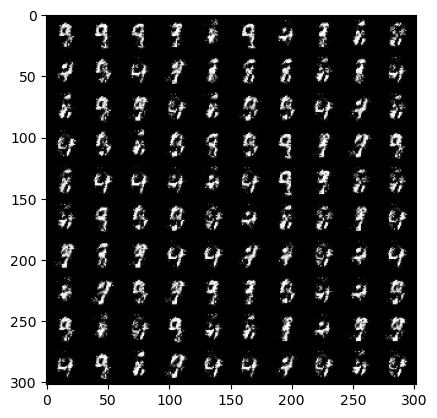

Epoch 48, step 22800: Generator loss: 0.014054882526397704, Discriminator loss: 0.00015805544331669807


  0%|          | 0/469 [00:00<?, ?it/s]

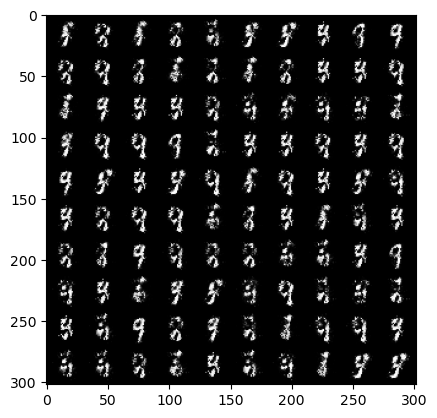

Epoch 49, step 23200: Generator loss: 0.01635528087615967, Discriminator loss: 4.6038734726607796e-05


  0%|          | 0/469 [00:00<?, ?it/s]

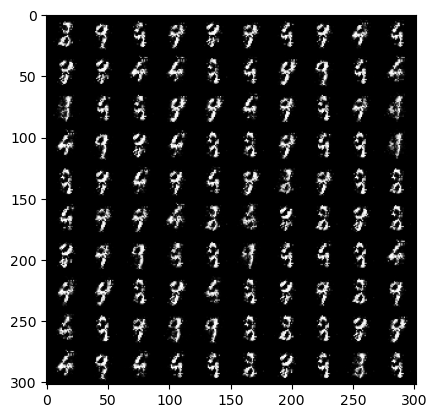

Epoch 50, step 23600: Generator loss: 0.014507598876953125, Discriminator loss: 4.5199012383818626e-05


  0%|          | 0/469 [00:00<?, ?it/s]

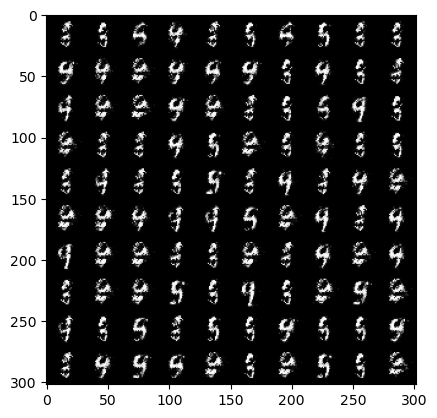

Epoch 51, step 24000: Generator loss: 0.017806695699691774, Discriminator loss: 0.00016595588997006416


  0%|          | 0/469 [00:00<?, ?it/s]

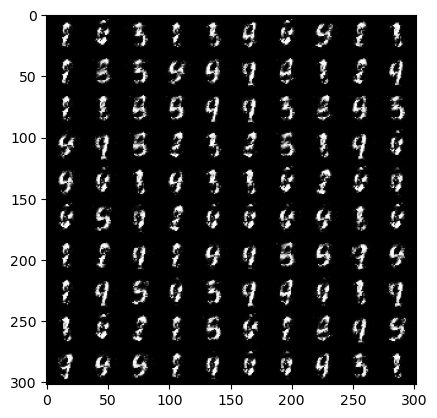

Epoch 52, step 24400: Generator loss: 0.015237631797790528, Discriminator loss: 3.1435221899300814e-05


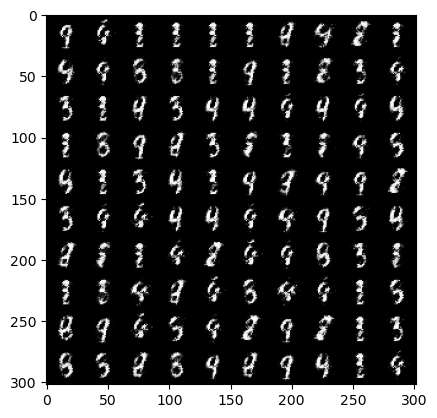

Epoch 52, step 24800: Generator loss: 0.013917081356048584, Discriminator loss: 4.78125736117363e-05


  0%|          | 0/469 [00:00<?, ?it/s]

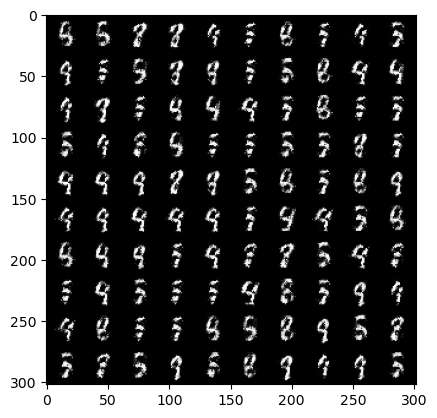

Epoch 53, step 25200: Generator loss: 0.015549082756042481, Discriminator loss: 0.0001700817793607712


  0%|          | 0/469 [00:00<?, ?it/s]

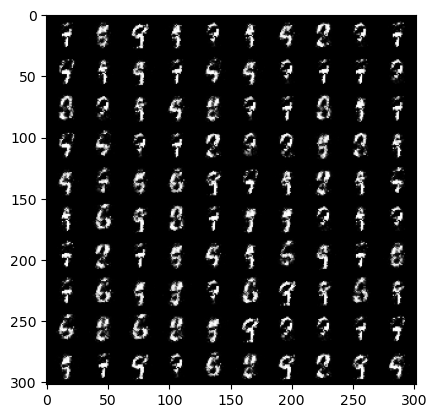

Epoch 54, step 25600: Generator loss: 0.014962608814239503, Discriminator loss: 0.00011842776089906692


  0%|          | 0/469 [00:00<?, ?it/s]

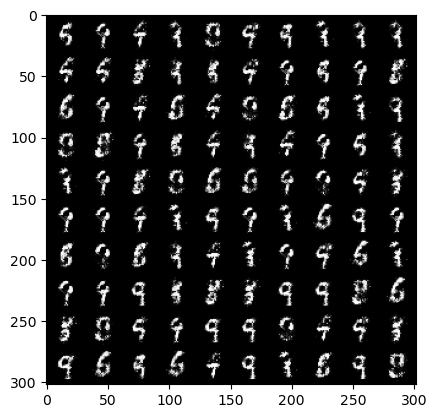

Epoch 55, step 26000: Generator loss: 0.012728298902511597, Discriminator loss: 0.00013292259536683558


  0%|          | 0/469 [00:00<?, ?it/s]

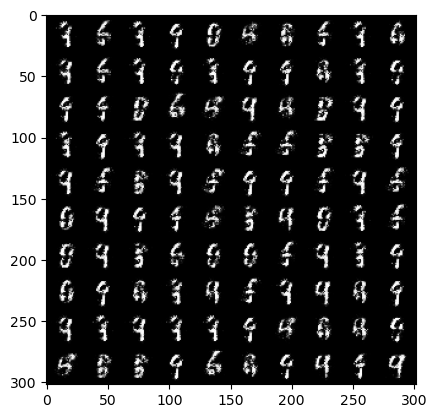

Epoch 56, step 26400: Generator loss: 0.013234565258026123, Discriminator loss: 9.578905999660492e-05


  0%|          | 0/469 [00:00<?, ?it/s]

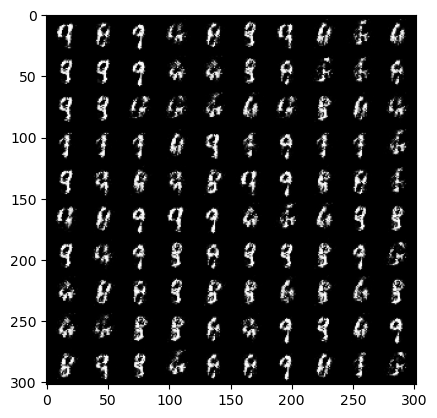

Epoch 57, step 26800: Generator loss: 0.011774260997772217, Discriminator loss: 0.00012803899124264718


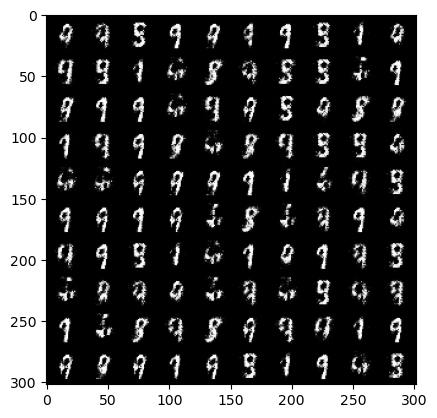

Epoch 57, step 27200: Generator loss: 0.013641130924224854, Discriminator loss: 7.924789562821388e-05


  0%|          | 0/469 [00:00<?, ?it/s]

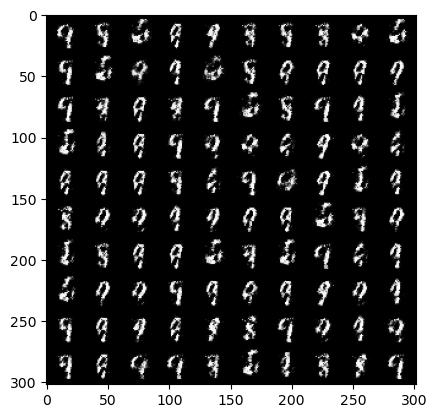

Epoch 58, step 27600: Generator loss: 0.011695683002471924, Discriminator loss: 0.00012964827008545398


  0%|          | 0/469 [00:00<?, ?it/s]

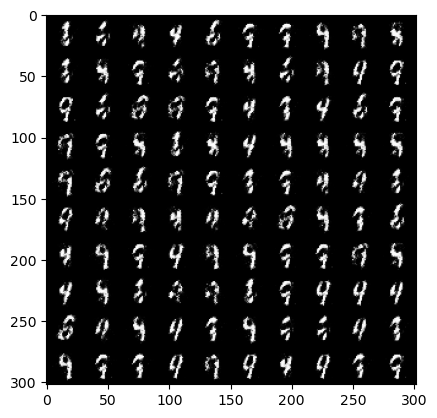

Epoch 59, step 28000: Generator loss: 0.01308319091796875, Discriminator loss: 0.00016075268387794495


  0%|          | 0/469 [00:00<?, ?it/s]

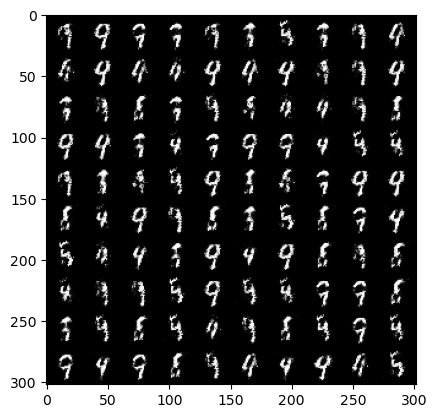

Epoch 60, step 28400: Generator loss: 0.014367480278015137, Discriminator loss: 0.00010852358303964138


  0%|          | 0/469 [00:00<?, ?it/s]

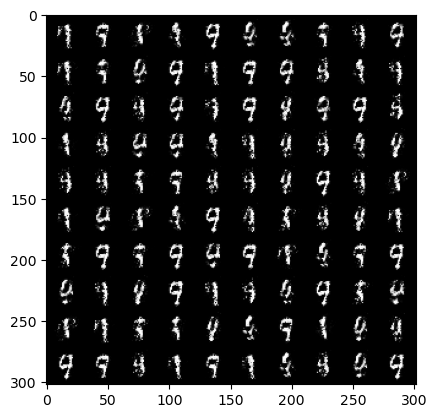

Epoch 61, step 28800: Generator loss: 0.014939850568771363, Discriminator loss: 7.08701740950346e-05


  0%|          | 0/469 [00:00<?, ?it/s]

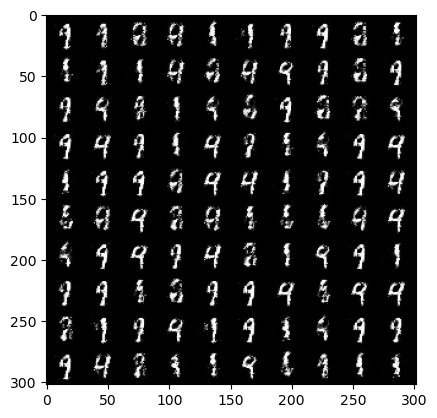

Epoch 62, step 29200: Generator loss: 0.011870094537734986, Discriminator loss: 0.0001427291799336672


  0%|          | 0/469 [00:00<?, ?it/s]

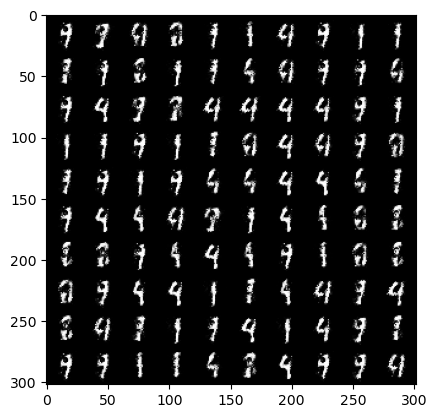

Epoch 63, step 29600: Generator loss: 0.01179912805557251, Discriminator loss: 7.382544223219156e-05


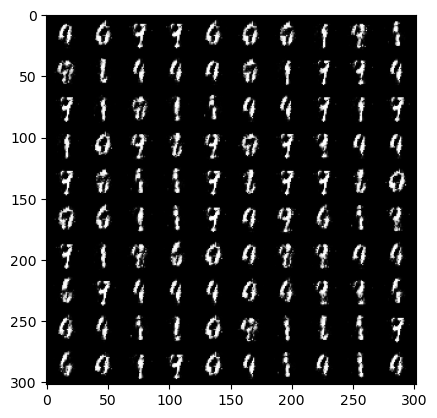

Epoch 63, step 30000: Generator loss: 0.012948174476623536, Discriminator loss: 0.0001227178517729044


  0%|          | 0/469 [00:00<?, ?it/s]

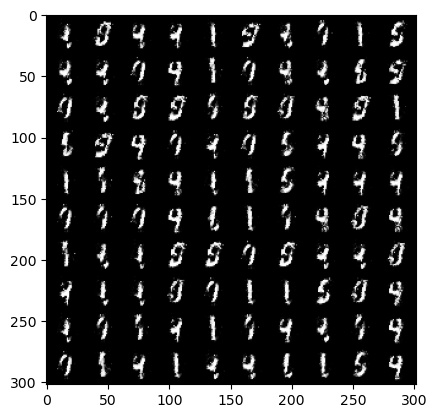

Epoch 64, step 30400: Generator loss: 0.013843648433685303, Discriminator loss: 0.00011385455727577209


  0%|          | 0/469 [00:00<?, ?it/s]

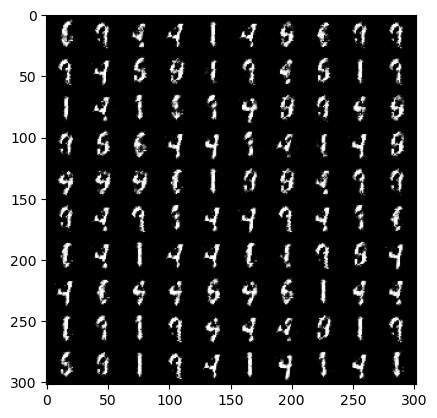

Epoch 65, step 30800: Generator loss: 0.01301048994064331, Discriminator loss: 0.00012746010906994343


  0%|          | 0/469 [00:00<?, ?it/s]

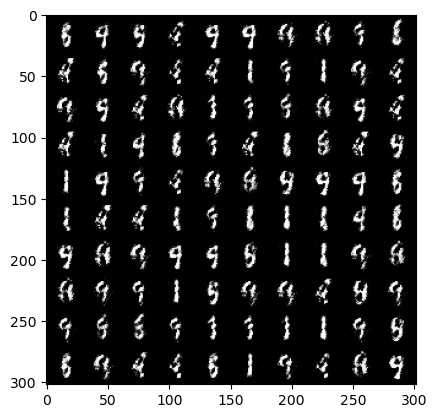

Epoch 66, step 31200: Generator loss: 0.011580328941345214, Discriminator loss: 0.00020551282912492752


  0%|          | 0/469 [00:00<?, ?it/s]

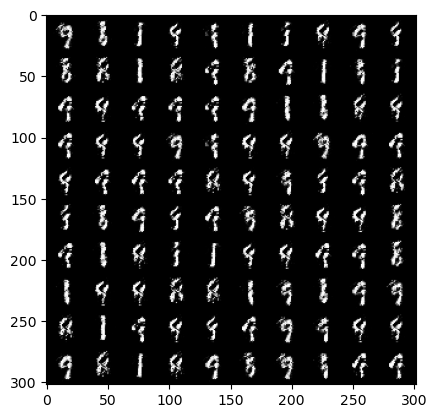

Epoch 67, step 31600: Generator loss: 0.012783205509185791, Discriminator loss: 0.0002025550976395607


  0%|          | 0/469 [00:00<?, ?it/s]

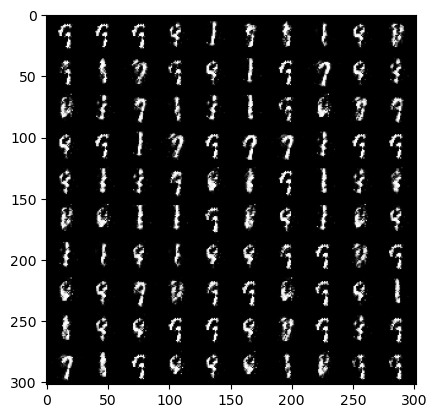

Epoch 68, step 32000: Generator loss: 0.01285074234008789, Discriminator loss: 0.00019638467580080033


  0%|          | 0/469 [00:00<?, ?it/s]

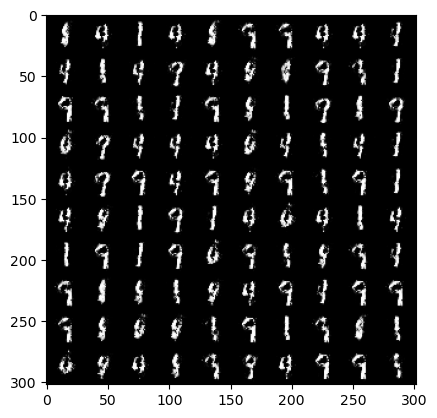

Epoch 69, step 32400: Generator loss: 0.011883796453475952, Discriminator loss: 0.00011232396587729454


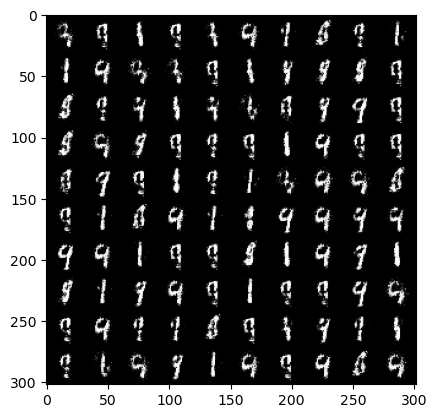

Epoch 69, step 32800: Generator loss: 0.010091745853424072, Discriminator loss: 0.00017072979360818863


  0%|          | 0/469 [00:00<?, ?it/s]

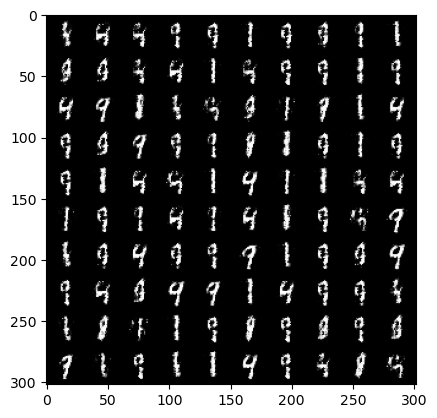

Epoch 70, step 33200: Generator loss: 0.012490509748458863, Discriminator loss: 0.00020415186882019042


  0%|          | 0/469 [00:00<?, ?it/s]

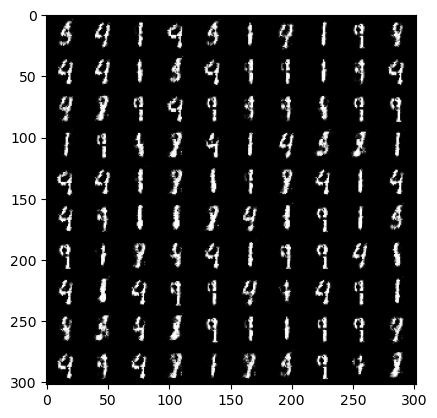

Epoch 71, step 33600: Generator loss: 0.009501121044158935, Discriminator loss: 0.000414736345410347


  0%|          | 0/469 [00:00<?, ?it/s]

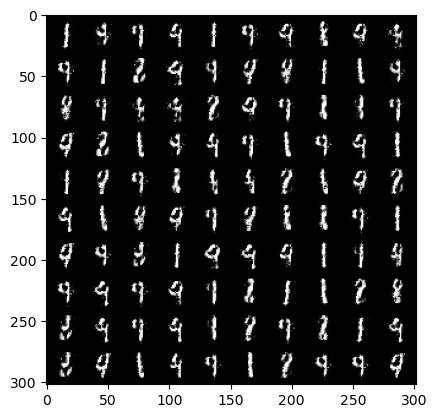

Epoch 72, step 34000: Generator loss: 0.011475696563720703, Discriminator loss: 0.00027653532102704046


  0%|          | 0/469 [00:00<?, ?it/s]

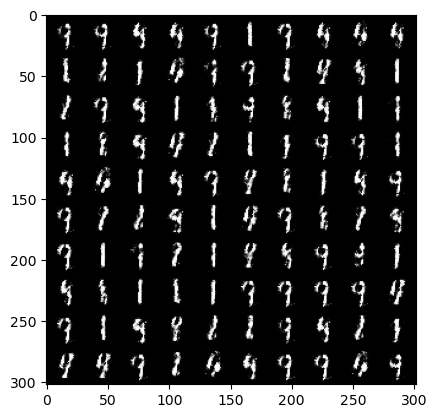

Epoch 73, step 34400: Generator loss: 0.011782482862472535, Discriminator loss: 0.00022638659924268723


  0%|          | 0/469 [00:00<?, ?it/s]

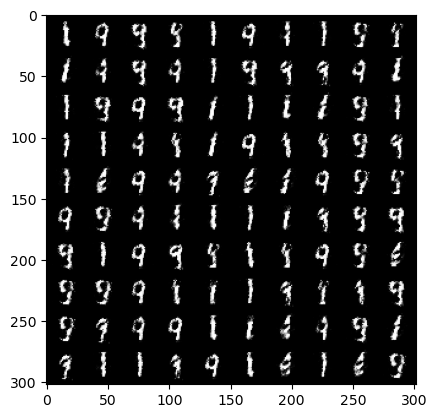

Epoch 74, step 34800: Generator loss: 0.01169858455657959, Discriminator loss: 0.00021610237658023835


  0%|          | 0/469 [00:00<?, ?it/s]

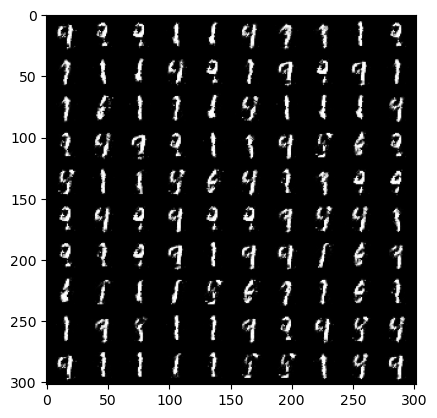

Epoch 75, step 35200: Generator loss: 0.011297043561935425, Discriminator loss: 0.0002996407076716423


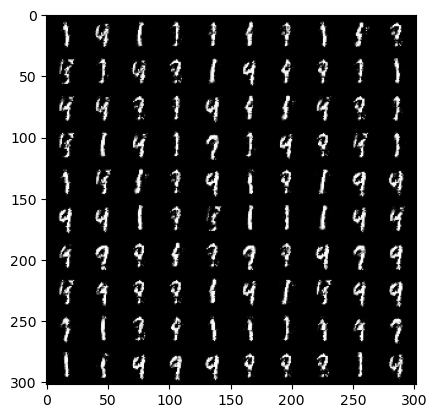

Epoch 75, step 35600: Generator loss: 0.012216624021530152, Discriminator loss: 0.0001869194768369198


  0%|          | 0/469 [00:00<?, ?it/s]

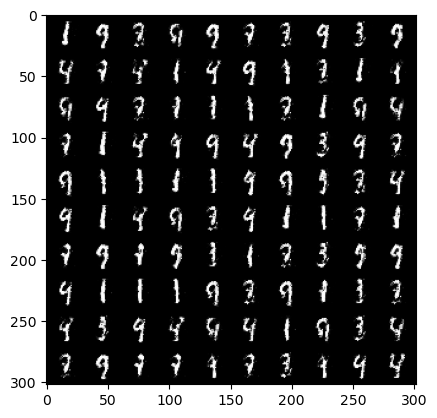

Epoch 76, step 36000: Generator loss: 0.011306204795837403, Discriminator loss: 0.0003659050166606903


  0%|          | 0/469 [00:00<?, ?it/s]

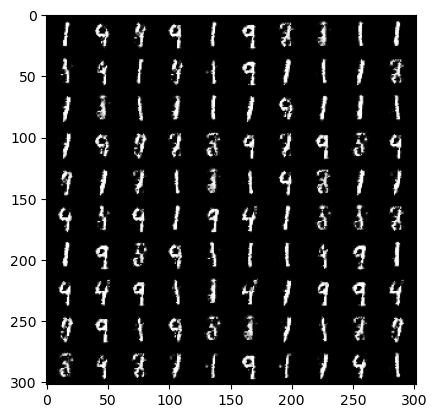

Epoch 77, step 36400: Generator loss: 0.011337859630584717, Discriminator loss: 0.00020935771986842157


  0%|          | 0/469 [00:00<?, ?it/s]

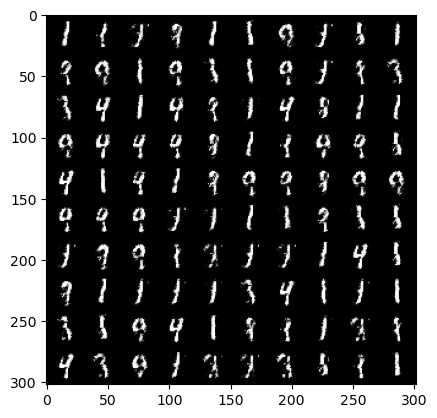

Epoch 78, step 36800: Generator loss: 0.008727040886878968, Discriminator loss: 0.0002203672006726265


  0%|          | 0/469 [00:00<?, ?it/s]

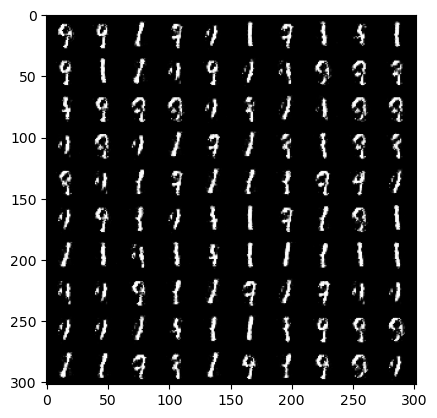

Epoch 79, step 37200: Generator loss: 0.008930653929710389, Discriminator loss: 0.0002147900313138962


  0%|          | 0/469 [00:00<?, ?it/s]

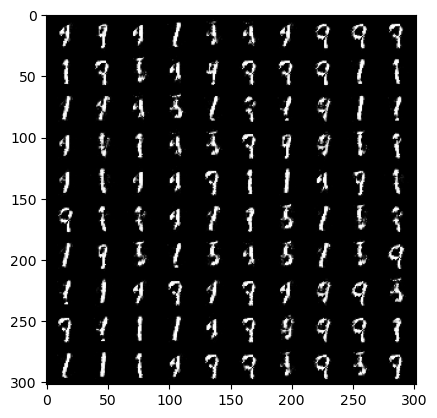

Epoch 80, step 37600: Generator loss: 0.008211005926132203, Discriminator loss: 0.00015919039025902749


  0%|          | 0/469 [00:00<?, ?it/s]

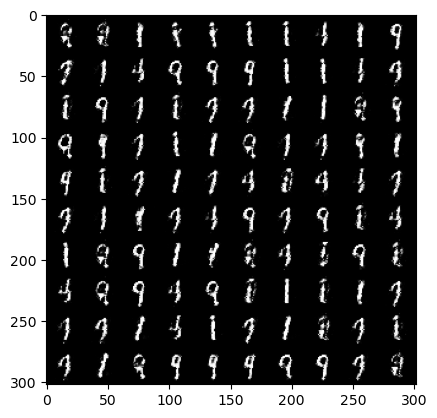

Epoch 81, step 38000: Generator loss: 0.011272413730621338, Discriminator loss: 0.0003227808326482773


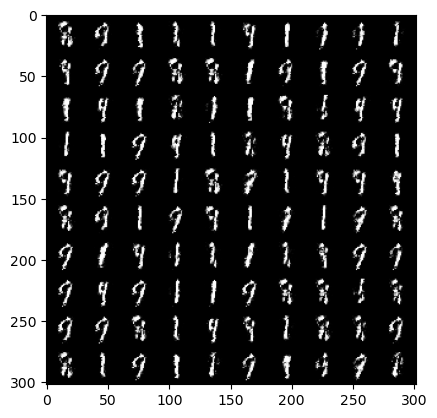

Epoch 81, step 38400: Generator loss: 0.008872220516204834, Discriminator loss: 0.0004294735938310623


  0%|          | 0/469 [00:00<?, ?it/s]

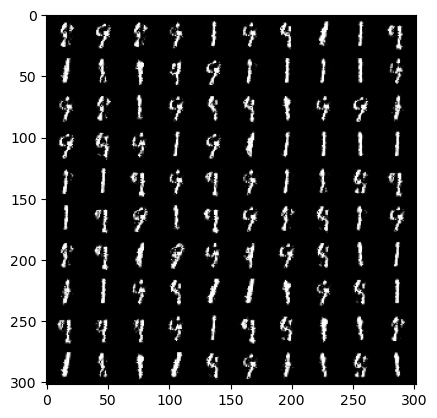

Epoch 82, step 38800: Generator loss: 0.00888327419757843, Discriminator loss: 0.00027001064270734784


  0%|          | 0/469 [00:00<?, ?it/s]

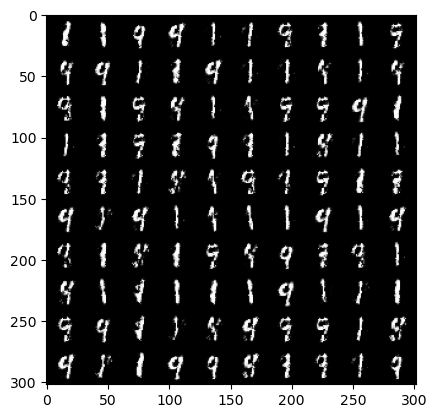

Epoch 83, step 39200: Generator loss: 0.009577550888061524, Discriminator loss: 0.0001582941599190235


  0%|          | 0/469 [00:00<?, ?it/s]

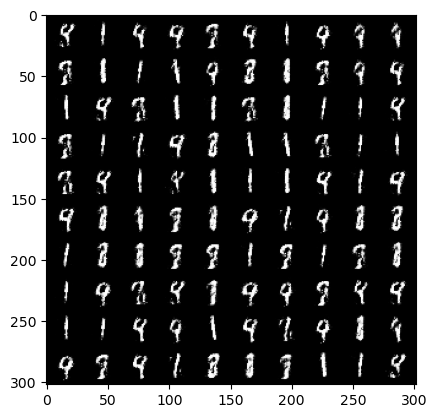

Epoch 84, step 39600: Generator loss: 0.009778806567192077, Discriminator loss: 0.00024643443524837496


  0%|          | 0/469 [00:00<?, ?it/s]

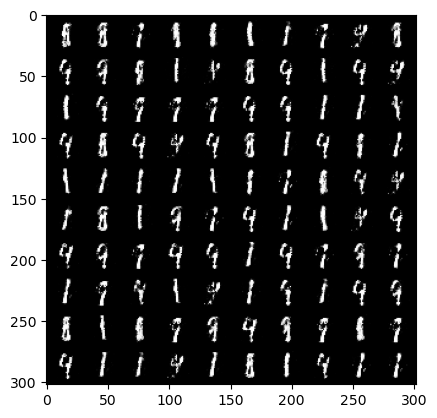

Epoch 85, step 40000: Generator loss: 0.007790562510490417, Discriminator loss: 0.0004885118827223778


  0%|          | 0/469 [00:00<?, ?it/s]

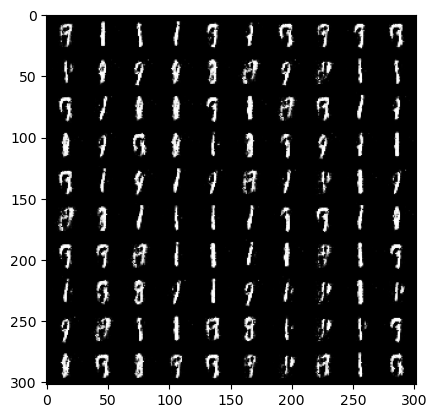

Epoch 86, step 40400: Generator loss: 0.009805840253829957, Discriminator loss: 0.00044677130877971647


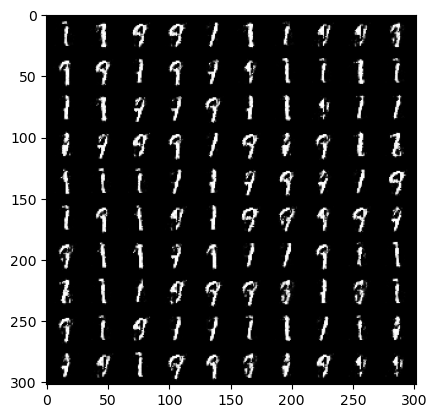

Epoch 86, step 40800: Generator loss: 0.008064228296279907, Discriminator loss: 0.00016977895051240922


  0%|          | 0/469 [00:00<?, ?it/s]

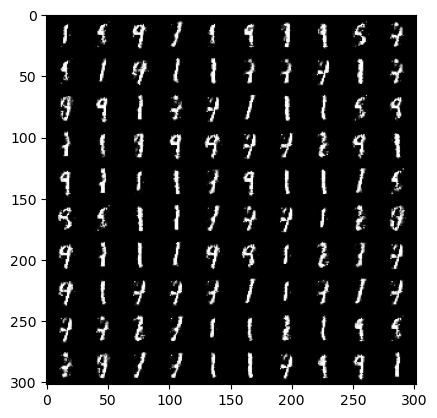

Epoch 87, step 41200: Generator loss: 0.008273921012878417, Discriminator loss: 0.00030230922624468803


  0%|          | 0/469 [00:00<?, ?it/s]

KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

In [14]:
for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    ## discriminator
    disc_opt.zero_grad()

    cur_bs = len(real)                           # 128 x 1 x 28 x 28
    real = real.view(cur_bs, -1).to(device)      # 128 x 784

    disc_loss = calc_disc_loss(loss_func, gen, disc, cur_bs, real, z_dim)

    disc_loss.backward(retain_graph=True)
    disc_opt.step()

    ## generator
    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func, gen, disc, cur_bs, z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()

    # visualisation and stats
    mean_disc_loss += disc_loss.item() / info_step   # .item() transforms tensor value to numerical value
    mean_gen_loss += gen_loss.item() / info_step

    if cur_step % info_step == 0 and cur_step>0:
      fake_noise = gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_gen_loss}, Discriminator loss: {mean_disc_loss}")
      

    #save losses
    loss_g.append(mean_gen_loss)
    loss_d.append(mean_disc_loss)

    mean_gen_loss = 0
    mean_disc_loss = 0


    cur_step += 1

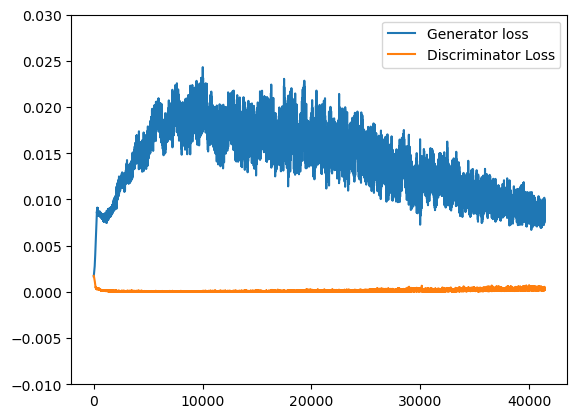

In [15]:
plt.figure()
plt.ylim(-0.01,0.03)
#plt.xlim(0,cur_step/469)
plt.plot(loss_g, label='Generator loss')
plt.plot(loss_d, label='Discriminator Loss')
plt.legend()
plt.savefig(f"{HOME}/graphs/losses.png")
plt.show()